<h2 style="color:turquoise">PROJECT 02: IMAGE PROCESSING</h2>
<h3 style="color:red">CARRIED OUT BY: 21127031 - PHAM QUOC DUY</h3>
<h3 style="color:green">LICENSE: VIETNAM NATIONAL UNIVERSITY - HCM UNIVERSITY OF SCIENCE</h3>

### Supporting Modules <a class="title" id="t1"></a>

In [16]:
import numpy as np #for numeric and matrix calculations
from PIL import Image #for image processing
import matplotlib.pyplot as plt #for image díplay
from datetime import datetime #for tracking runtime

### Image Import <a class="title" id="t2"></a>

In [17]:
#---------------------------------------------------
#Function: get user's input on the image's name
#Parameters: None
#Returns:
#img_name: str
#   name of the image
#---------------------------------------------------

def img_input():
    print('Enter the name of the image (extension included): ')
    img_name = input()
    
    return img_name

### Change Image's Brightness <a class="title" id="cib"></a>

In [18]:
#---------------------------------------------------
#Function: change the image's brightness

#Parameters: 
#img: np.ndarray
#   image that needs processing

#Returns:
#(bright, dark): tuple(np.ndarray, np.ndarray)
#   images that got brightened/darkened
#---------------------------------------------------

def change_brightness(img):
    tmp_img = img.astype(np.int32)
    scale = np.array([60,60,60]) #adjust brightness scale here
    
    bright = np.clip(tmp_img + scale, 0, 255).astype(np.uint8)
    dark = np.clip(tmp_img - scale, 0, 255).astype(np.uint8)
    
    return bright, dark

### Change Image's Contrast <a class="title" id="cic"></a>

In [19]:
#---------------------------------------------------
#Function: change the image's contrast

#Parameters: 
#img: np.ndarray
#   image that needs processing

#Returns:
# img_arr : np.ndarray
#   resulting image that got its contrast changed
#---------------------------------------------------

def change_contrast(img):
    alpha = 1.3 #adjust contrast rate here
    return np.clip((img * alpha), 0, 255).astype(np.uint8) #allowing negative contrast rate

### Flip Image <a class="title" id="fi"></a>

In [20]:
#---------------------------------------------------
#Function: flip the image (horizontally/vertically)

#Parameters: 
#img: np.ndarray
#   image that needs processing
#direction: str
#   direction of which to flip the image ("horizontal" or "vertical")

#Returns:
# img_arr: np.ndarray
#   resulting image that got flipped
#---------------------------------------------------

def flip_img(img, direction):
    if direction == 'vertical':
        return img[::-1]
    elif direction == 'horizontal':
        return img[:, ::-1, :]

### Convert from RGB Image to Grayscale/Sepia Image <a class="title" id="cgs"></a>

In [21]:
#---------------------------------------------------
#Function: convert a pixel to grayscale then applies it to the whole image

#Parameters: 
#pixel: np.array
#   pixel that needs processing

#img: np.ndarray
#   image that needs processing

#Returns:
# p: np.array
#   resulting grayscale pixel

# img_arr: np.ndarray
#   resulting grayscale image
#---------------------------------------------------

def pixel_to_grayscale(pixel):
    scale = np.array([0.3, 0.59, 0.11]) #percentage of contribution according to each channel
    result = np.sum(pixel * scale)
    return result.astype(np.uint8)

def img_to_grayscale(img):
    return np.apply_along_axis(pixel_to_grayscale, 2, img) #apply to whole image

#---------------------------------------------------
#Function: convert a pixel to sepia then applies it to the whole image

#Parameters: 
#pixel: np.array
#   pixel that needs processing

#img: np.ndarray
#   image that needs processing

#Returns:
# p: np.array
#   resulting sepia pixel

# img_arr: np.ndarray
#   resulting sepia image
#---------------------------------------------------

def pixel_to_sepia(pixel):
    R ,G ,B = pixel
    tr = (int)(0.393*R + 0.769*G + 0.189 * B)
    tg = (int)(0.349*R + 0.686*G + 0.168 * B)
    tb = (int)(0.272*R + 0.534*G + 0.131 * B) #calculating the new RGB values according to the formula
    
    #limiting the values
    if tr > 255:
        R = 255
    else: R = tr
    
    if tg > 255:
        G = 255
    else: G = tg
    
    if tb > 255:
        B = 255
    else: B = tb 
    
    return np.array([R,G,B]).astype(np.uint8)

def img_to_sepia(img):
    return np.apply_along_axis(pixel_to_sepia, 2, img) #apply to whole image
    

### Blurring/Sharpening the Image <a class="title" id="bti"></a>

In [22]:
#---------------------------------------------------
#Function: blurring the image

#Parameters: 
#img: np.ndarray
#   image that needs processing

#Returns:
# img_arr: np.ndarray
#   resulting image that got blurred
#---------------------------------------------------

def img_blur(img):
    kernel = np.array([[1,2,1], #define kernel
                       [2,4,2],
                       [1,2,1]])
    kernel_sum = 16
    
    result = np.empty_like(img, dtype=float)
    for i in range(1, img.shape[0] - 1): #leaving the squares at the edge of the image since there are not enough "neighbors"
        for j in range(1, img.shape[1] - 1):
            res_pixel = np.sum(img[i-1:i+2, j-1:j+2, :] * kernel[:,:, np.newaxis], axis=(0,1))
            result[i,j] = res_pixel
    return (result / kernel_sum).astype(np.uint8)

#---------------------------------------------------
#Function: sharpening the image

#Parameters: 
#img: np.ndarray
#   image that needs processing

#Returns:
# img_arr: np.ndarray
#   resulting image that got sharpened
#---------------------------------------------------

def img_sharpen(img):
    kernel = np.array([[0,-1,0], #define kernel
                       [-1,5,-1],
                       [0,-1,0]])                 
    
    result = np.empty_like(img, dtype=float)
    for i in range(1, img.shape[0] - 1): #leaving the squares at the edge of the image since there are not enough "neighbors"
        for j in range(1, img.shape[1] - 1):
            res_pixel = np.sum(img[i-1:i+2, j-1:j+2, :] * kernel[:,:, np.newaxis], axis=(0,1))
            result[i,j] = res_pixel
    return np.clip((result).astype(np.uint8), 0, 255)
    

### Cropping the Image According To A Pre-defined Size <a class="title" id="cims"></a>

In [23]:
#---------------------------------------------------
#Function: cropping the image from the center to a pre-defined size image

#Parameters: 
#img: np.ndarray
#   image that needs processing

#Returns:
# img_arr: np.ndarray
#   cropped image
#---------------------------------------------------

def img_center_crop(img):
    height, width, _ = img.shape
    size = 110 #adjust size here
    c_y = (int)(height / 2)
    c_x = (int)(width / 2)
    return img[c_y-size:c_y+size, c_x-size:c_x+size, :].astype(np.uint8)

### Cropping the Image Using A Circular Frame <a class="title" id="cic"></a>

In [24]:
#---------------------------------------------------
#Function: estimating whether a point(x,y) is in/on the circle or not

#Parameters: 
#img: np.ndarray
#   image that needs processing
#x,y: int
#   x and y coordinates of the point

#Returns:
# d: float
#   distance from the point to the circle's center. If d>0 then the point is outside the circle, inside otherwise
#---------------------------------------------------

def circular_equation(img, x, y):
    height, width, _ = img.shape
    
    if width < height:
        radius = (int)(width / 2)
    else: radius = (int)(height / 2)
    
    c_x, c_y = ((int)(width / 2), (int)(height / 2))
    return np.sqrt((x - c_x)**2 + (y - c_y)**2) - radius

#---------------------------------------------------
#Function: cropping the image using the circular frame

#Parameters: 
#img: np.ndarray
#   image that needs processing

#Returns:
# tmp_img: np.ndarray
#   resulting image that got cropped
#---------------------------------------------------

def img_circular_crop(img):
    tmp_img = img.copy()
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if circular_equation(tmp_img,i,j) > 0: #the pixel is outside the circle
                tmp_img[i,j] = [0,0,0] #set to black
    return tmp_img

### Cropping the Image Using A Frame Constructed By Two Diagonally Overlapping Ellipse <a class="title" id="cie"></a>

In [25]:
#---------------------------------------------------
#Function: estimating whether a point(x,y) is in/on the ellipse or not

#Parameters: 
#img: np.ndarray
#   image that needs processing
#x,y: int
#   x and y coordinates of the point
#degree: int
#   degree of which to tilt the ellipse

#Returns:
# d: float
#   distance from the point to the ellipse. If d>0 then the point is outside the ellipse, inside otherwise
#---------------------------------------------------

def ellipse_equation(img, x, y, degree):
    height, width, _ = img.shape
    c_x, c_y = ((int)(width / 2), (int)(height / 2)) #x and y coordinates of the center
    
    angle = np.deg2rad(degree)
    
    a = 0.7*(int)(width / 2) #length of the semi-axes in the x and y directions
    b = 1.24*(int)(height / 2)
    
    return ((((x-c_x)*np.cos(angle) + (y-c_y)*np.sin(angle))**2) / (a**2) + (((x-c_x)*np.sin(angle) - (y-c_y)*np.cos(angle))**2) / (b**2)) - 1

#---------------------------------------------------
#Function: cropping the image using two diagonally overlapped ellipses frame

#Parameters: 
#img: np.ndarray
#   image that needs processing

#Returns:
# tmp_img: np.ndarray
#   resulting image that got cropped
#---------------------------------------------------
   
def img_ellipse_crop(img):
    tmp_img = img.copy()
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if ellipse_equation(tmp_img,i,j,45) > 0 and ellipse_equation(tmp_img,i,j,135) > 0 : #if pixel lays outside both ellipses
                tmp_img[i,j] = [0,0,0] #change color to black               
    return tmp_img

### Show Image <a class="title" id='si'></a>

In [26]:
#---------------------------------------------------
#Function: showing the image for comparison

#Parameters: 
#original_img: Image
#   original image
#result_img: Image
#   image after processing

#Returns: None
#---------------------------------------------------

def show_img(original_img, result_img):
    _, pics = plt.subplots(1, 2, figsize=(15,10))
    
    pics[0].axis("off")
    pics[0].set_title("Original image")
    pics[0].imshow(original_img)
    
    pics[1].axis("off")
    pics[1].set_title("Processed image")
    pics[1].imshow(result_img)

    plt.show()
    
#---------------------------------------------------
#Function: showing the image for comparison (used for grayscale image)

#Parameters: 
#original_img: Image
#   original image
#result_img: Image
#   image after processing

#Returns: None
#---------------------------------------------------
    
def show_img_grayscale(original_img, result_img): #used specifically for grayscale image-showing
    _, pics = plt.subplots(1, 2, figsize=(15,10))
    
    pics[0].axis("off")
    pics[0].set_title("Original image")
    pics[0].imshow(original_img)
    
    pics[1].axis("off")
    pics[1].set_title("Processed image")
    pics[1].imshow(result_img, cmap='gray', vmin=0, vmax=255)

### Image Export <a class="title" id="ie"></a>

In [27]:
#---------------------------------------------------
#Function: exporting image as .png file

#Parameters: 
#img: np.ndarray
#   image to export
#img_name: str
#   name of the image
#function: str
#   name of the function used to process the image

#Returns: None
#---------------------------------------------------

def save_image(img, img_name, function):
    seperator = img_name.index('.')
    name = img_name[:seperator] #retrieve image name only
    img.save(f"{name}_{function}.png")

### Supporting Functions <a class="title" id="sf"></a>

In [28]:
#---------------------------------------------------
#Function: showing the menu and retrieve selection

#Parameters: None
#Returns: 
#choice: int
#   user's choice of function
#---------------------------------------------------

def menu():
    print("-----------------IMAGE PROCESSING-----------------", end='\n')
    print("1. Change the image's brightness", end='\n')
    print("2. Change the image's contrast", end='\n')
    print("3. Flip the image (vertically and horizontally)", end='\n')
    print("4. Converting the image from RGB to Grayscale/Sepia", end='\n')
    print("5. Blurring the image", end='\n')
    print("6. Sharpening the image", end='\n')
    print("7. Cropping the image from the center with a pre-defined size", end='\n')
    print("8. Cropping the image using a circular frame", end='\n')
    print("9. Cropping the image using two diagonally overlapped ellipse frames", end='\n')
    print("0. Show all functionalities",end='\n')
    
    print("Enter your choice: ")
    choice = int(input())
    
    while choice < 0 and choice > 9:
        print("Enter your choice: ")
        choice = int(input())
        
    return choice

### Main Function <a class="title" id="main"></a>

In [29]:
#---------------------------------------------------
#Function: executing the corresponding functions based on user's choice

#Parameters: None
#Returns: None
#---------------------------------------------------

def main():         
    img_name = img_input()
    
    img = Image.open(img_name)
    img_arr = np.array(img)
    
    choice = menu()
    match choice:
        case 1:
            start = datetime.now()
            bright_arr, dark_arr = change_brightness(img_arr)
            stop = datetime.now()
            
            bright = Image.fromarray(bright_arr)
            show_img(img, bright)
            save_image(bright, img_name, "change_brightness_bright")
            
            dark = Image.fromarray(dark_arr)
            show_img(img, dark)
            save_image(dark, img_name, "change_brightness_dark")
            print(f"Runtime: {stop-start}", end='\n')
            return
            
        case 2:
            start = datetime.now()
            contrast_arr = change_contrast(img_arr)
            stop = datetime.now()
            
            constrast = Image.fromarray(contrast_arr)
            show_img(img, constrast)
            save_image(constrast, img_name, "change_contrast")
            print(f"Runtime: {stop-start}", end='\n')
            return
            
        case 3:
            start_1 = datetime.now()
            horz_arr = flip_img(img_arr, "horizontal")
            stop_1 = datetime.now()
    
            horz = Image.fromarray(horz_arr)
            show_img(img, horz)
            save_image(horz, img_name, "flip_horizontal")
            print(f"Runtime: {stop_1-start_1}", end='\n')

            start_2 = datetime.now()
            vert_arr = flip_img(img_arr, "vertical")
            stop_2 = datetime.now()
            
            vert = Image.fromarray(vert_arr)
            show_img(img, vert)
            save_image(vert, img_name, "flip_vertical")
            print(f"Runtime: {stop_2-start_2}", end='\n')
            return
            
        case 4:
            start_1 = datetime.now()
            gray_arr = img_to_grayscale(img_arr)
            stop_1 = datetime.now()
            
            gray = Image.fromarray(gray_arr)
            show_img_grayscale(img, gray)
            save_image(gray, img_name, "RGB_to_grayscale")
            print(f"Runtime: {stop_1-start_1}", end='\n')

            start_2 = datetime.now()
            sepia_arr = img_to_sepia(img_arr)
            stop_2 = datetime.now()
            
            sepia = Image.fromarray(sepia_arr)
            show_img(img, sepia)
            save_image(sepia, img_name, "RGB_to_sepia")
            print(f"Runtime: {stop_2-start_2}", end='\n')
            return
        
        case 5:
            start = datetime.now()
            blur_arr = img_blur(img_arr)
            stop = datetime.now()
            
            blur = Image.fromarray(blur_arr)
            show_img(img, blur)
            save_image(blur, img_name, "blur")
            print(f"Runtime: {stop-start}", end='\n')
            return
        
        case 6:
            start = datetime.now()
            sharp_arr = img_sharpen(img_arr)
            stop = datetime.now()
            
            sharp = Image.fromarray(sharp_arr)
            show_img(img, sharp)
            save_image(sharp, img_name, "sharpen")
            print(f"Runtime: {stop-start}", end='\n')
            return
        
        case 7:
            start = datetime.now()
            cen_crop_arr = img_center_crop(img_arr)
            stop = datetime.now()
            
            center_crop = Image.fromarray(cen_crop_arr)
            show_img(img, center_crop)
            save_image(center_crop, img_name, "center_crop")
            print(f"Runtime: {stop-start}", end='\n')
            return
            
        case 8:
            start = datetime.now()
            cir_crop_arr = img_circular_crop(img_arr)
            stop = datetime.now()
            
            circular_crop = Image.fromarray(cir_crop_arr)
            show_img(img, circular_crop)
            save_image(circular_crop, img_name, "circular_crop")
            print(f"Runtime: {stop-start}", end='\n')
            return
            
        case 9:
            start = datetime.now()
            ell_crop_arr = img_ellipse_crop(img_arr)
            stop = datetime.now()
            
            ellipse_crop = Image.fromarray(ell_crop_arr)
            show_img(img, ellipse_crop)
            save_image(ellipse_crop, img_name, "ellipse_crop")
            print(f"Runtime: {stop-start}", end='\n')
            return
        
        case 0:
            start = datetime.now()
            bright_arr, dark_arr = change_brightness(img_arr)
    
            bright = Image.fromarray(bright_arr)
            show_img(img, bright)
            save_image(bright, img_name, "change_brightness_bright")
            
            dark = Image.fromarray(dark_arr)
            show_img(img, dark)
            save_image(dark, img_name, "change_brightness_dark")
        
            contrast_arr = change_contrast(img_arr)
            
            constrast = Image.fromarray(contrast_arr)
            show_img(img, constrast)
            save_image(constrast, img_name, "change_contrast")
            
            horz_arr = flip_img(img_arr, "horizontal")
    
            horz = Image.fromarray(horz_arr)
            show_img(img, horz)
            save_image(horz, img_name, "flip_horizontal")
    
            vert_arr = flip_img(img_arr, "vertical")
    
            vert = Image.fromarray(vert_arr)
            show_img(img, vert)
            save_image(vert, img_name, "flip_vertical")
            
            gray_arr = img_to_grayscale(img_arr)

            gray = Image.fromarray(gray_arr)
            show_img_grayscale(img, gray)
            save_image(gray, img_name, "RGB_to_grayscale")
    
            sepia_arr = img_to_sepia(img_arr)
    
            sepia = Image.fromarray(sepia_arr)
            show_img(img, sepia)
            save_image(sepia, img_name, "RGB_to_sepia")
            
            blur_arr = img_blur(img_arr)
            
            blur = Image.fromarray(blur_arr)
            show_img(img, blur)
            save_image(blur, img_name, "blur")
    
            sharp_arr = img_sharpen(blur_arr)
            
            sharp = Image.fromarray(sharp_arr)
            show_img(blur, sharp)
            save_image(sharp, img_name, "sharpen")
            
            
            cen_crop_arr = img_center_crop(img_arr)
            
            center_crop = Image.fromarray(cen_crop_arr)
            show_img(img, center_crop)
            save_image(center_crop, img_name, "center_crop")
            
            cir_crop_arr = img_circular_crop(img_arr)
            
            circular_crop = Image.fromarray(cir_crop_arr)
            show_img(img, circular_crop)
            save_image(circular_crop, img_name, "circular_crop")
            
            ell_crop_arr = img_ellipse_crop(img_arr)
            
            ellipse_crop = Image.fromarray(ell_crop_arr)
            show_img(img, ellipse_crop)
            save_image(ellipse_crop, img_name, "ellipse_crop")
            
            stop = datetime.now()
            print(f"Total Runtime: {stop-start}", end='\n')
            return       

Enter the name of the image (extension included): 
-----------------IMAGE PROCESSING-----------------
1. Change the image's brightness
2. Change the image's contrast
3. Flip the image (vertically and horizontally)
4. Converting the image from RGB to Grayscale/Sepia
5. Blurring the image
6. Sharpening the image
7. Cropping the image from the center with a pre-defined size
8. Cropping the image using a circular frame
9. Cropping the image using two diagonally overlapped ellipse frames
0. Show all functionalities
Enter your choice: 


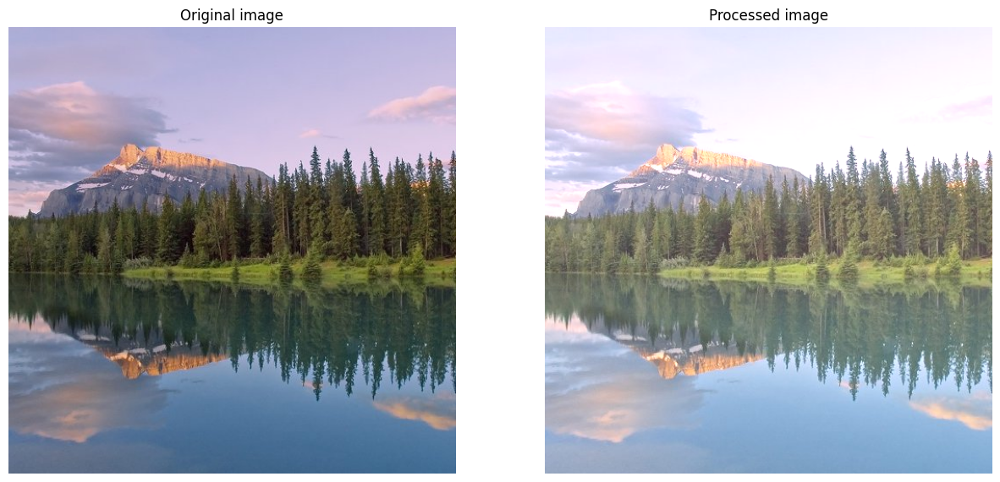

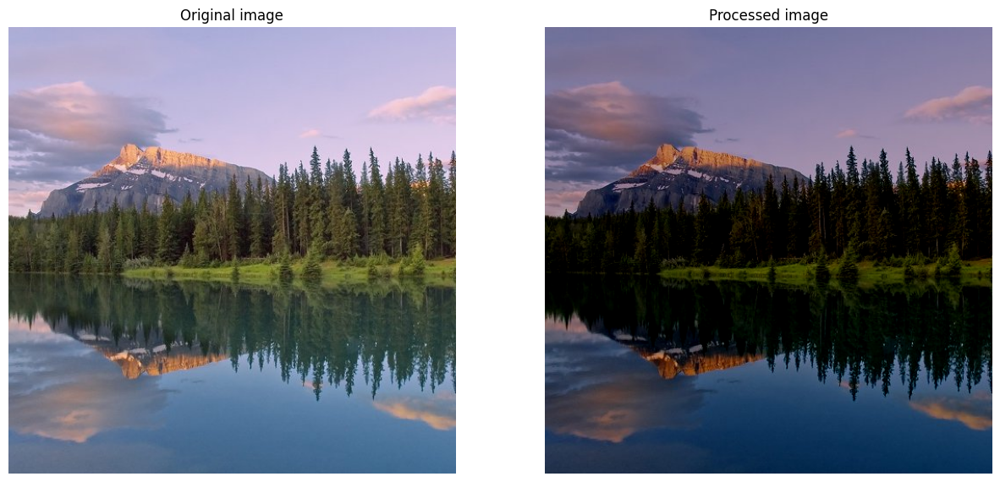

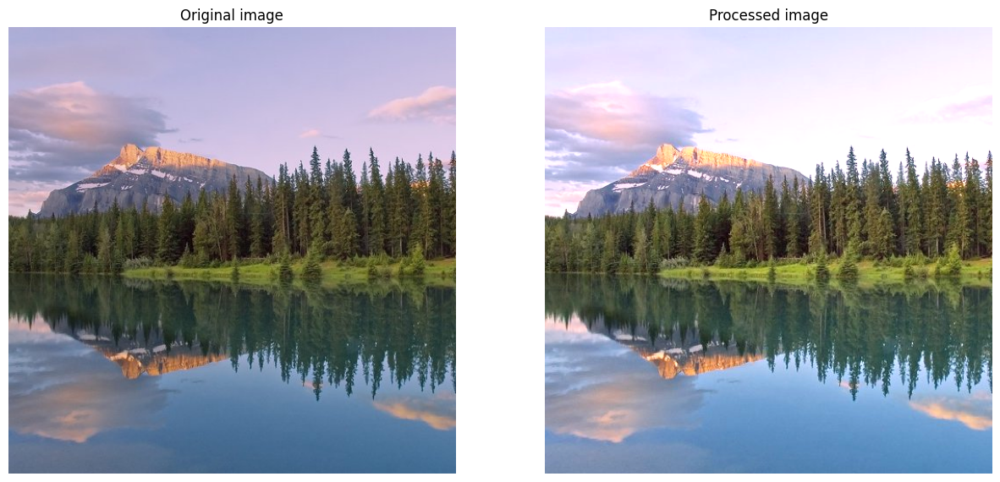

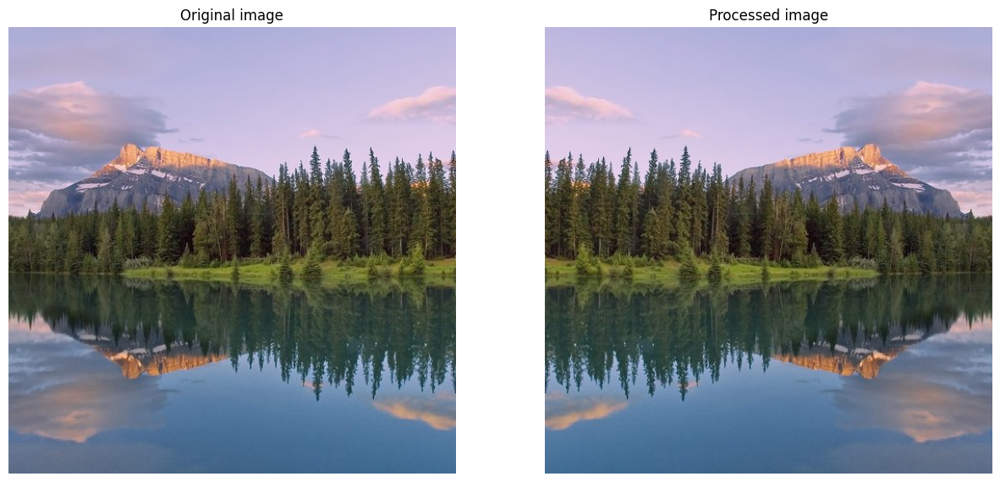

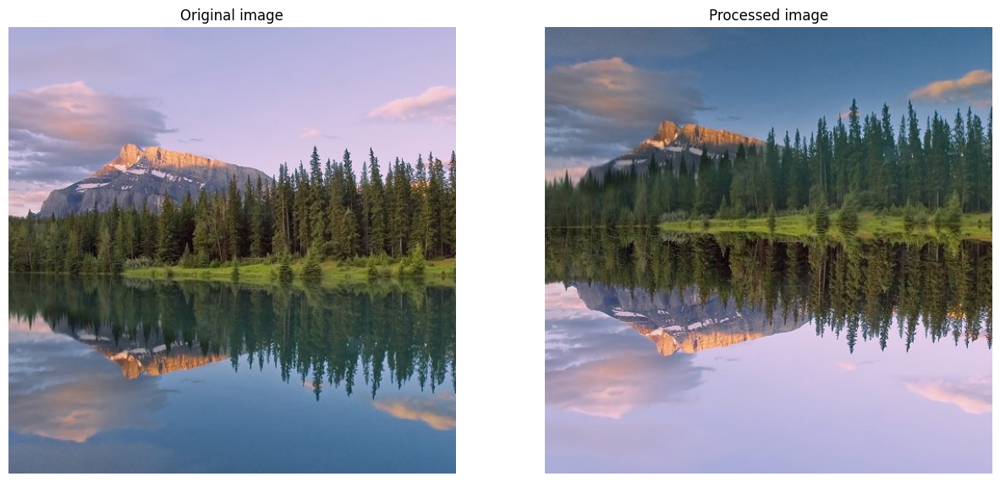

...

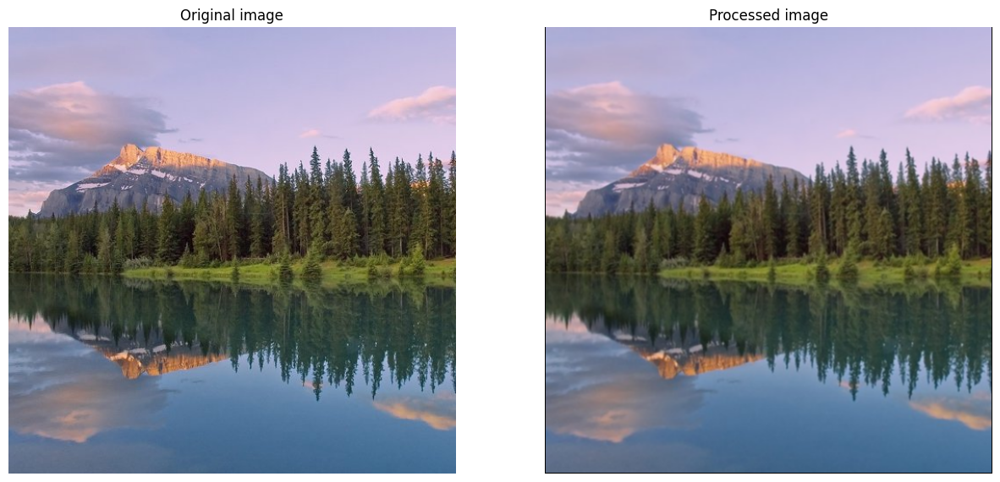

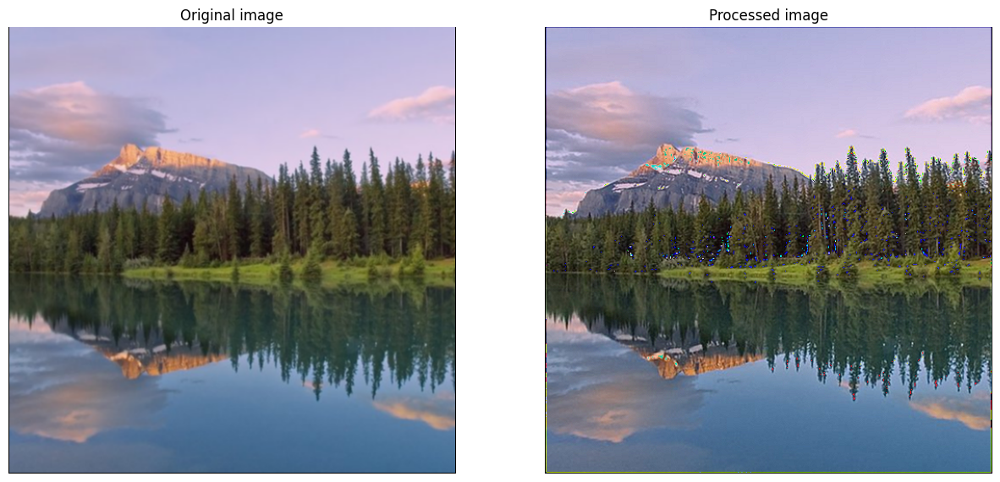

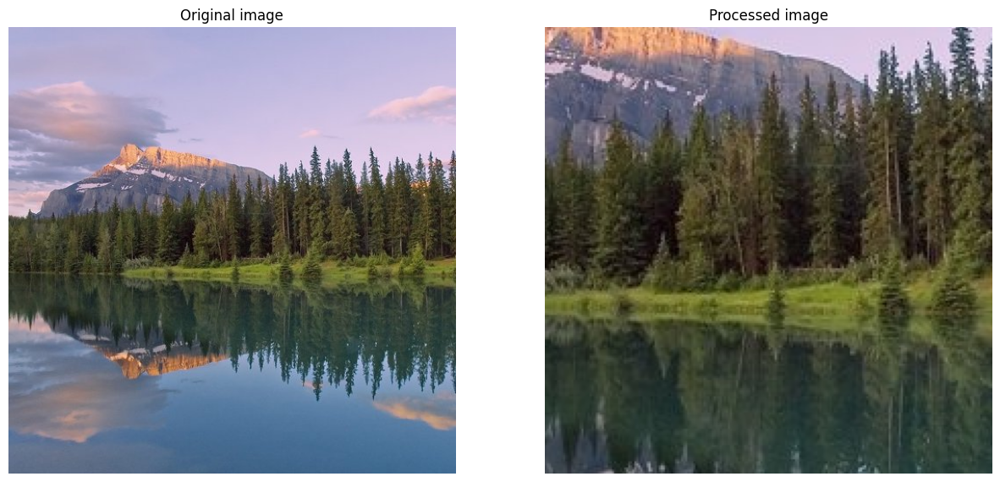

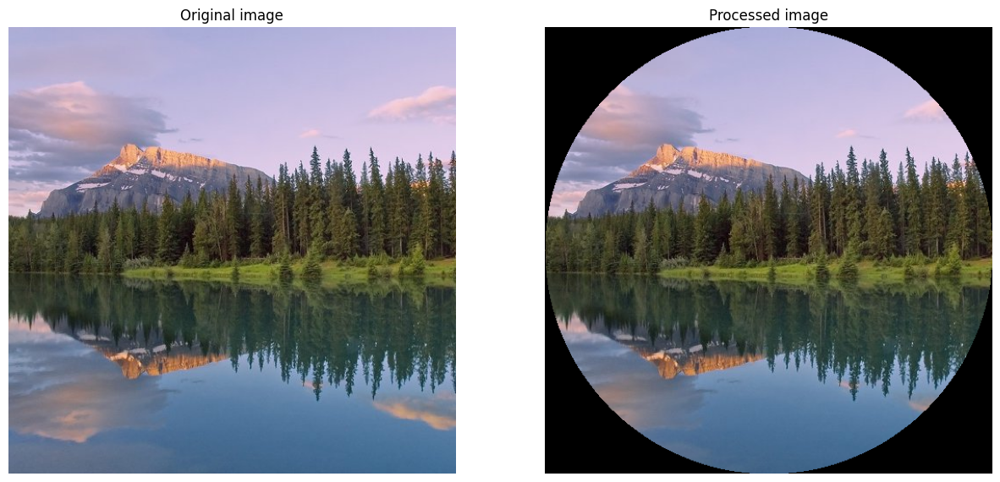

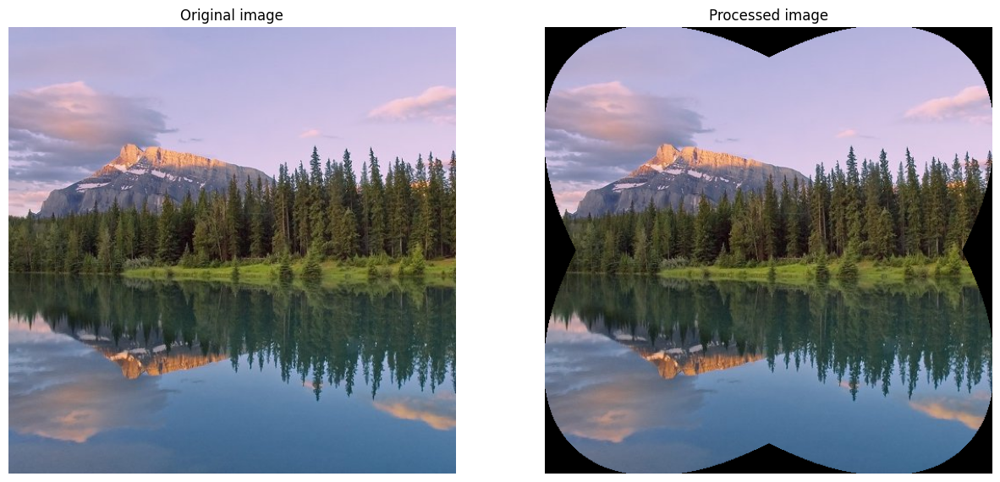

Total Runtime: 0:00:39.009102


In [30]:
#def menu()
#def execute()
if __name__ == '__main__':
    main()